goal - to aggregate all green data to run marss analysis
add photoperiod and lunar phase to the aggregate

In [23]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import datetime
import matplotlib.dates as mdates
import requests
from sys import platform
import datetime
import ephem
from typing import List, Tuple
from urllib.request import urlopen
from bs4 import BeautifulSoup
import io

In [24]:
from sys import platform
if platform == "linux" or platform == "linux2":
    data_string = "/home/maria/Documents/data/pied_piper/green/"
    output_string = "/home/maria/Documents/output/pied_piper/green/"

elif platform == "win32"or platform == "win64":
    data_string = "C:/Users/maria/OneDrive/Documents/data/pied_piper/green/"
    output_string = "C:/Users/maria/OneDrive/Documents/output/pied_piper/green/"

In [25]:
years = [2014,2017,2018,2019,2020,2021,2022]
csv_names = []
for year in years:
    csv_names.append(data_string+ "green_" + str(year)+"_day.csv")
    
df_day = pd.concat([pd.read_csv(csv_name, header=0) for csv_name in csv_names])

#day of year
df_day['date_range'] = pd.to_datetime(df_day['date_range'])
df_day['midpoint_doy'] = df_day['doy']
df_day['doy'] = df_day['date_range'].dt.dayofyear
df_day['year'] = df_day['date_range'].dt.year

In [26]:
years = [2014,2017,2018,2019,2020,2021,2022]
csv_names = []
for year in years:
    csv_names.append(data_string+ "green_" + str(year)+"_night.csv")
    
df_night = pd.concat([pd.read_csv(csv_name, header=0) for csv_name in csv_names])

#night of year
df_night['date_range'] = pd.to_datetime(df_night['date_range'])
df_night['midpoint_doy'] = df_night['doy']
df_night['doy'] = df_night['date_range'].dt.dayofyear
df_night['year'] = df_night['date_range'].dt.year

In [27]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display(df_night)

,Unnamed: 0,date_range,Unnamed: 0.1,StartDate,EndDate,chinook0_hatchery_num,chinook0_wild_num,chinook1_hatchery_num,chinook1_wild_num,chum0_mixed_num,coho0_wild_num,coho1_hatchery_num,coho1_wild_num,pink0_wild,steelheadsmolt_hatchery_num,steelheadsmolt_wild_num,start_datetime,end_datetime,In,midpoint,Date,doy,daytime_category,chinook0_hatchery_perhour,chinook0_wild_perhour,chinook1_hatchery_perhour,chinook1_wild_perhour,chum0_mixed_perhour,coho0_wild_perhour,coho1_hatchery_perhour,coho1_wild_perhour,pink0_wild_perhour,steelheadsmolt_hatchery_perhour,steelheadsmolt_wild_perhour,midpoint_doy,year,pink0_wild_num,coho1_mixed_num,coho1_mixed_perhour
0,0,2014-01-24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,24,night,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,24.0,2014,NaN,NaN,NaN
1,1,2014-01-25,1.0,2014-01-24,2014-01-25,0.0,11.0,0.0,0.0,0.0,0.0,0.0,2.0,8.0,0.0,0.0,2014-01-24 16:00:00,2014-01-25 08:00:00,16.000000,2014-01-25 00:00:00,2014-01-24 00:00:00,25,night,0.000000,0.687500,0.000000,0.000000,0.000000,0.000000,0.000000,0.125000,0.500000,0.000000,0.000000,25.0,2014,NaN,NaN,NaN
2,2,2014-01-26,3.0,2014-01-25,2014-01-26,0.0,2.0,0.0,0.0,0.0,0.0,0.0,5.0,3.0,0.0,0.0,2014-01-25 17:00:00,2014-01-26 08:00:00,15.000000,2014-01-26 00:30:00,2014-01-25 00:00:00,26,night,0.000000,0.133333,0.000000,0.000000,0.000000,0.000000,0.000000,0.333333,0.200000,0.000000,0.000000,26.0,2014,NaN,NaN,NaN
3,3,2014-01-27,5.0,2014-01-26,2014-01-27,0.0,6.0,0.0,0.0,0.0,0.0,0.0,3.0,2.0,0.0,0.0,2014-01-26 17:00:00,2014-01-27 08:30:00,15.500000,2014-01-27 00:45:00,2014-01-26 00:00:00,27,night,0.000000,0.387097,0.000000,0.000000,0.000000,0.000000,0.000000,0.193548,0.129032,0.000000,0.000000,27.0,2014,NaN,NaN,NaN
4,4,2014-01-28,7.0,2014-01-27,2014-01-28,0.0,4.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,2014-01-27 16:45:00,2014-01-28 08:00:00,15.250000,2014-01-28 00:22:30,2014-01-27 00:00:00,28,night,0.000000,0.262295,0.000000,0.000000,0.000000,0.000000,0.000000,0.196721,0.000000,0.000000,0.000000,28.0,2014,NaN,NaN,NaN
5,5,2014-01-29,9.0,2014-01-28,2014-01-29,0.0,24.0,0.0,4.0,0.0,14.0,0.0,0.0,0.0,0.0,1.0,2014-01-28 16:45:00,2014-01-29 08:30:00,15.750000,2014-01-29 00:37:30,2014-01-28 00:00:00,29,night,0.000000,1.523810,0.000000,0.253968,0.000000,0.888889,0.000000,0.000000,0.000000,0.000000,0.063492,29.0,2014,NaN,NaN,NaN
6,6,2014-01-30,11.0,2014-01-29,2014-01-30,0.0,219.0,0.0,0.0,0.0,0.0,0.0,10.0,124.0,0.0,2.0,2014-01-29 16:30:00,2014-01-30 09:00:00,16.500000,2014-01-30 00:45:00,2014-01-29 00:00:00,30,night,0.000000,13.272727,0.000000,0.000000,0.000000,0.000000,0.000000,0.606061,7.515152,0.000000,0.121212,30.0,2014,NaN,NaN,NaN
7,7,2014-01-31,13.0,2014-01-30,2014-01-31,0.0,41.0,0.0,0.0,0.0,0.0,0.0,5.0,8.0,0.0,0.0,2014-01-30 16:45:00,2014-01-31 08:45:00,16.000000,2014-01-31 00:45:00,2014-01-30 00:00:00,31,night,0.000000,2.562500,0.000000,0.000000,0.000000,0.000000,0.000000,0.312500,0.500000,0.000000,0.000000,31.0,2014,NaN,NaN,NaN
8,8,2014-02-01,15.0,2014-01-31,2014-02-01,0.0,21.0,0.0,0.0,0.0,0.0,0.0,4.0,11.0,0.0,0.0,2014-01-31 17:00:00,2014-02-01 08:00:00,15.000000,2014-02-01 00:30:00,2014-01-31 00:00:00,32,night,0.000000,1.400000,0.000000,0.000000,0.000000,0.000000,0.000000,0.266667,0.733333,0.000000,0.000000,32.0,2014,NaN,NaN,NaN
9,9,2014-02-02,17.0,2014-02-01,2014-02-02,0.0,19.0,0.0,0.0,0.0,0.0,0.0,4.0,9.0,0.0,0.0,2014-02-01 17:00:00,2014-02-02 08:00:00,15.000000,2014-02-02 00:30:00,2014-02-01 00:00:00,33,night,0.000000,1.266667,0.000000,0.000000,0.000000,0.000000,0.000000,0.266667,0.600000,0.000000,0.000000,33.0,2014,NaN,NaN,NaN


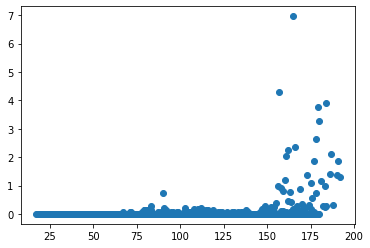

In [7]:
plt.scatter(df_night['doy'],df_night['chinook0_hatchery_perhour'])

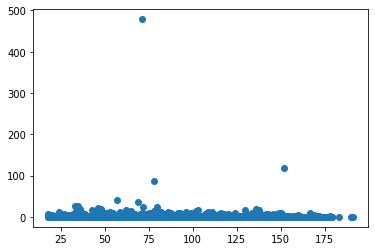

In [9]:
plt.scatter(df_day['doy'],df_day['chinook0_wild_perhour'])

/home/maria/miniconda3/envs/analysis/lib/python3.8/site-packages/pandas/core/series.py:679: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


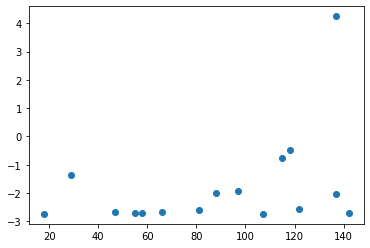

In [10]:
plt.scatter(df_night['doy'],np.log(df_night['chinook1_wild_perhour']))

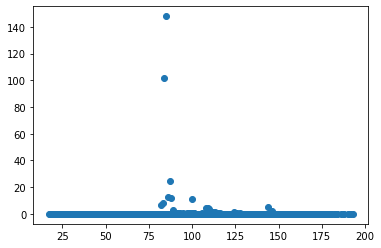

In [22]:
plt.scatter(df_night['doy'],df_night['chinook1_hatchery_perhour'])

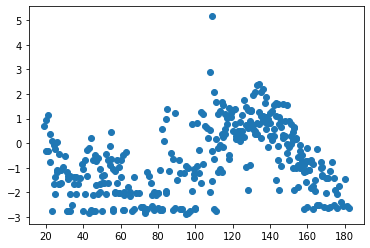

In [25]:
plt.scatter(df_night['doy'],np.log(df_night['coho1_wild_perhour']))

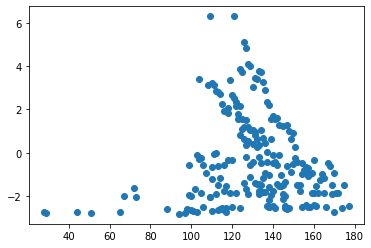

In [26]:
plt.scatter(df_night['doy'],np.log(df_night['coho1_hatchery_perhour']))

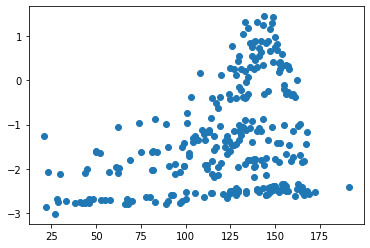

In [30]:
plt.scatter(df_night['doy'],np.log(df_night['steelheadsmolt_wild_perhour']))

In [11]:
#latitude and longitude 47.369882, -122.243903

def photo_period_new(year):
    hours_list = [] 
    doy = range(1,366)
    for days in doy:
    
        i = datetime.datetime(year, 1, 1) + datetime.timedelta(days - 1)
        date = i.strftime("%Y-%m-%d")
        url = "https://api.sunrise-sunset.org/json?lat=47.369882&lng=--122.243903&date=" + date
        response = requests.get(url)
        result = response.json()
        t = result['results']['day_length']
        (h, m, s) = t.split(':')
        hours = int(h) + int(m) * (1/60) #ignoring seconds
        hours_list.append(hours)
    df = pd.DataFrame({'doy' : doy, "photoperiod" : hours_list})
    return(df)

In [12]:
photo = photo_period_new(2014)

In [13]:
df_lunar = pd.DataFrame(pd.date_range(start='2013-12-21', end='2022-12-21'), columns = ['Date'])
df_lunar.head()
moon_list = []
for i in df_lunar['Date']:
    a=ephem.Moon(i)
    mn=a.moon_phase #illuminated percentage of the moon.
    moon_list.append(mn)

df_lunar['lunar_phase'] = moon_list
# df_lunar.head()
# df_atu_photo_lunar = df_atu_photo.merge(df_lunar, how = 'left', on='Date')
# df_atu_photo_lunar['photo_diff'] = df_atu_photo_lunar['photoperiod'].diff()
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    display(df_lunar)

,Date,lunar_phase
0,2013-12-21,0.885992
1,2013-12-22,0.819990
2,2013-12-23,0.742163
3,2013-12-24,0.654455
4,2013-12-25,0.559001
5,2013-12-26,0.458387
6,2013-12-27,0.355994
7,2013-12-28,0.256307
8,2013-12-29,0.164971
9,2013-12-30,0.088452


In [14]:
df_lunar['doy']  = df_lunar['Date'].dt.dayofyear
df_lunar_photo = df_lunar.merge(photo, how = 'left', on='doy')
df_lunar_photo

,Date,lunar_phase,doy,photoperiod
0,2013-12-21,0.885992,355,8.516667
1,2013-12-22,0.819990,356,8.516667
2,2013-12-23,0.742163,357,8.516667
3,2013-12-24,0.654455,358,8.516667
4,2013-12-25,0.559001,359,8.516667
...,...,...,...,...
3283,2022-12-17,0.439019,351,8.533333
3284,2022-12-18,0.339464,352,8.516667
3285,2022-12-19,0.243308,353,8.516667
3286,2022-12-20,0.155707,354,8.516667


In [28]:
# df_day.merge(df_lunar_photo, on = 'Date')
df_day['midpoint_date'] = pd.to_datetime(df_day['Date'])
df_day['Date'] = pd.to_datetime(df_day['date_range'].dt.date)
df_day_w_covariates = df_day.merge(df_lunar_photo, on = ['Date','doy'], how = 'left')

In [29]:
# df_night.merge(df_lunar_photo, on = 'Date')
df_night['midpoint_date'] = pd.to_datetime(df_night['Date'])
df_night['Date'] = pd.to_datetime(df_night['date_range'].dt.date)
df_night_w_covariates = df_night.merge(df_lunar_photo, on = ['Date','doy'], how = 'left')

In [17]:
#temp, flow, turbidity

url = 'https://waterdata.usgs.gov/nwis/dv?cb_00010=on&cb_00065=on&cb_00095=on&cb_63680=on&cb_72137=on&format=rdb&site_no=12113390&legacy=&referred_module=sw&period=&begin_date=2013-12-01&end_date=2023-11-17'

html = urlopen(url).read()
soup = BeautifulSoup(html, features="html.parser")

# kill all script and style elements
for script in soup(["script", "style"]):
    script.extract()    # rip it out

# get text
text = soup.get_text()
text_data = text[3389:]
df_cov = pd.read_csv(io.StringIO(text_data), sep = '\t', header = None, names = ["agency_cd", "site_no",
                                                                             "Date",
                                                                             "flow", "random_flow",
                                                                             "temp_max", "temp_max_random",
                                                                             "temp_min", "temp_min_random",
                                                                             "temp", "temp_random",
                                                                             "gage_height_max","gage_height_max_random",
                                                                             "gage_height_min","gage_height_min_random",
                                                                             "turbidity_max","turbidity_max_random",
                                                                             "turbidity_median","turbidity_median_random",
                                                                             "turbidity_min","turbidity_min_random"])

df_temp_flow_subset = df_cov[['Date','flow','temp','turbidity_median']]
df_temp_flow_subset['Date'] = pd.to_datetime(df_temp_flow_subset['Date'])
df_temp_flow_subset = df_temp_flow_subset.rename(columns={'turbidity_median':'turbidity',})
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    display(df_temp_flow_subset)


<ipython-input-17-4acac209c9dc>:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_flow_subset['Date'] = pd.to_datetime(df_temp_flow_subset['Date'])


,Date,flow,temp,turbidity
0,2013-12-03,4670,5.3,100.0
1,2013-12-04,3970,4.2,NaN
2,2013-12-05,2850,2.9,27.5
3,2013-12-06,2120,2.2,18.0
4,2013-12-07,1740,1.1,13.0
5,2013-12-08,1500,0.4,8.4
6,2013-12-09,1340,0.8,7.5
7,2013-12-10,1310,2.0,7.0
8,2013-12-11,1240,2.9,6.1
9,2013-12-12,1160,3.4,6.6


In [18]:
df_temp_flow_subset['temp_inp'] = df_temp_flow_subset['temp'].interpolate(limit = 30)
df_temp_flow_subset['flow_inp'] = df_temp_flow_subset['flow'].interpolate(limit = 10)

In [19]:
# df_temp_flow_subset['water_year'] = (df_temp_flow_subset['Date'].dt.year[df_temp_flow_subset['Date']
#                                                                          < pd.to_datetime((df_temp_flow_subset['Date'].dt.year).astype(str)+'-12-21')])
# df_water_year = pd.DataFrame({'Date':pd.DatetimeIndex(['2013-12-21', '2014-12-21', '2015-12-21', '2016-12-21',
#                                             '2017-12-21','2018-12-21','2019-12-21','2020-12-21',
#                                             '2021-12-21','2022-12-21','2023-12-21']),
#                    'water_year':[2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023]}, 
# columns=['Date', 'water_year'])

# determine the water year
#cond it false when month is 12 or day is greater than 21 or month is 12 and day > 21
#we want it to be false when month is 12 and day > 21
filter1 = (df_temp_flow_subset.Date.dt.month == 12) & (df_temp_flow_subset.Date.dt.day >= 21)
filter2 = (df_temp_flow_subset.Date.dt.month >= 4)
df_temp_flow_subset['water_year_april'] = df_temp_flow_subset.Date.dt.year.where(filter2, np.nan)

df_temp_flow_subset['water_year'] = df_temp_flow_subset.Date.dt.year.where(~(filter1), 
                                                                           df_temp_flow_subset.Date.dt.year+1)

df_temp_flow_subset['atu_solstice'] = df_temp_flow_subset.groupby(['water_year'])['temp_inp'].cumsum()
df_temp_flow_subset['atu_april'] = df_temp_flow_subset.groupby(['water_year_april'])['temp_inp'].cumsum()
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    display(df_temp_flow_subset)


,Date,flow,temp,turbidity,temp_inp,flow_inp,water_year_april,water_year,atu_solstice,atu_april
0,2013-12-03,4670,5.3,100.0,5.300000,4670,2013.0,2013,5.300000,5.300000
1,2013-12-04,3970,4.2,NaN,4.200000,3970,2013.0,2013,9.500000,9.500000
2,2013-12-05,2850,2.9,27.5,2.900000,2850,2013.0,2013,12.400000,12.400000
3,2013-12-06,2120,2.2,18.0,2.200000,2120,2013.0,2013,14.600000,14.600000
4,2013-12-07,1740,1.1,13.0,1.100000,1740,2013.0,2013,15.700000,15.700000
5,2013-12-08,1500,0.4,8.4,0.400000,1500,2013.0,2013,16.100000,16.100000
6,2013-12-09,1340,0.8,7.5,0.800000,1340,2013.0,2013,16.900000,16.900000
7,2013-12-10,1310,2.0,7.0,2.000000,1310,2013.0,2013,18.900000,18.900000
8,2013-12-11,1240,2.9,6.1,2.900000,1240,2013.0,2013,21.800000,21.800000
9,2013-12-12,1160,3.4,6.6,3.400000,1160,2013.0,2013,25.200000,25.200000


In [30]:
df_day_w_all_covariates = df_day_w_covariates.merge(df_temp_flow_subset, on = 'Date', how = 'left')
df_night_w_all_covariates = df_night_w_covariates.merge(df_temp_flow_subset, on = 'Date', how = 'left')

In [31]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    display(df_night_w_all_covariates)


,Unnamed: 0,date_range,Unnamed: 0.1,StartDate,EndDate,chinook0_hatchery_num,chinook0_wild_num,chinook1_hatchery_num,chinook1_wild_num,chum0_mixed_num,coho0_wild_num,coho1_hatchery_num,coho1_wild_num,pink0_wild,steelheadsmolt_hatchery_num,steelheadsmolt_wild_num,start_datetime,end_datetime,In,midpoint,Date,doy,daytime_category,chinook0_hatchery_perhour,chinook0_wild_perhour,chinook1_hatchery_perhour,chinook1_wild_perhour,chum0_mixed_perhour,coho0_wild_perhour,coho1_hatchery_perhour,coho1_wild_perhour,pink0_wild_perhour,steelheadsmolt_hatchery_perhour,steelheadsmolt_wild_perhour,midpoint_doy,year,pink0_wild_num,coho1_mixed_num,coho1_mixed_perhour,midpoint_date,lunar_phase,photoperiod,flow,temp,turbidity,temp_inp,flow_inp,water_year_april,water_year,atu_solstice,atu_april
0,0,2014-01-24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2014-01-24,24,night,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,24.0,2014,NaN,NaN,NaN,NaT,0.524869,9.283333,1540,5.7,6.9,5.700000,1540,NaN,2014,195.000000,NaN
1,1,2014-01-25,1.0,2014-01-24,2014-01-25,0.0,11.0,0.0,0.0,0.0,0.0,0.0,2.0,8.0,0.0,0.0,2014-01-24 16:00:00,2014-01-25 08:00:00,16.000000,2014-01-25 00:00:00,2014-01-25,25,night,0.000000,0.687500,0.000000,0.000000,0.000000,0.000000,0.000000,0.125000,0.500000,0.000000,0.000000,25.0,2014,NaN,NaN,NaN,2014-01-24,0.418052,9.316667,1430,5.4,5.8,5.400000,1430,NaN,2014,200.400000,NaN
2,2,2014-01-26,3.0,2014-01-25,2014-01-26,0.0,2.0,0.0,0.0,0.0,0.0,0.0,5.0,3.0,0.0,0.0,2014-01-25 17:00:00,2014-01-26 08:00:00,15.000000,2014-01-26 00:30:00,2014-01-26,26,night,0.000000,0.133333,0.000000,0.000000,0.000000,0.000000,0.000000,0.333333,0.200000,0.000000,0.000000,26.0,2014,NaN,NaN,NaN,2014-01-25,0.311336,9.366667,1380,5.0,4.9,5.000000,1380,NaN,2014,205.400000,NaN
3,3,2014-01-27,5.0,2014-01-26,2014-01-27,0.0,6.0,0.0,0.0,0.0,0.0,0.0,3.0,2.0,0.0,0.0,2014-01-26 17:00:00,2014-01-27 08:30:00,15.500000,2014-01-27 00:45:00,2014-01-27,27,night,0.000000,0.387097,0.000000,0.000000,0.000000,0.000000,0.000000,0.193548,0.129032,0.000000,0.000000,27.0,2014,NaN,NaN,NaN,2014-01-26,0.210773,9.416667,1360,4.8,4.4,4.800000,1360,NaN,2014,210.200000,NaN
4,4,2014-01-28,7.0,2014-01-27,2014-01-28,0.0,4.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,2014-01-27 16:45:00,2014-01-28 08:00:00,15.250000,2014-01-28 00:22:30,2014-01-28,28,night,0.000000,0.262295,0.000000,0.000000,0.000000,0.000000,0.000000,0.196721,0.000000,0.000000,0.000000,28.0,2014,NaN,NaN,NaN,2014-01-27,0.123272,9.450000,1380,5.3,4.1,5.300000,1380,NaN,2014,215.500000,NaN
5,5,2014-01-29,9.0,2014-01-28,2014-01-29,0.0,24.0,0.0,4.0,0.0,14.0,0.0,0.0,0.0,0.0,1.0,2014-01-28 16:45:00,2014-01-29 08:30:00,15.750000,2014-01-29 00:37:30,2014-01-29,29,night,0.000000,1.523810,0.000000,0.253968,0.000000,0.888889,0.000000,0.000000,0.000000,0.000000,0.063492,29.0,2014,NaN,NaN,NaN,2014-01-28,0.055772,9.500000,1710,6.5,15.5,6.500000,1710,NaN,2014,222.000000,NaN
6,6,2014-01-30,11.0,2014-01-29,2014-01-30,0.0,219.0,0.0,0.0,0.0,0.0,0.0,10.0,124.0,0.0,2.0,2014-01-29 16:30:00,2014-01-30 09:00:00,16.500000,2014-01-30 00:45:00,2014-01-30,30,night,0.000000,13.272727,0.000000,0.000000,0.000000,0.000000,0.000000,0.606061,7.515152,0.000000,0.121212,30.0,2014,NaN,NaN,NaN,2014-01-29,0.014128,9.550000,2170,6.5,17.0,6.500000,2170,NaN,2014,228.500000,NaN
7,7,2014-01-31,13.0,2014-01-30,2014-01-31,0.0,41.0,0.0,0.0,0.0,0.0,0.0,5.0,8.0,0.0,0.0,2014-01-30 16:45:00,2014-01-31 08:45:00,16.000000,2014-01-31 00:45:00,2014-01-31,31,night,0.000000,2.562500,0.000000,0.000000,0.000000,0.000000,0.000000,0.312500,0.500000,0.000000,0.000000,31.0,2014,NaN,NaN,NaN,2014-01-30,0.002001,9.600000,2240,6.1,11.0,6.100000,2240,NaN,2014,234.600000,NaN
8,8,2014-02-01,15.0,2014-01-31,2014-02-01,0.0,21.0,0.0,0.0,0.0,0.0,0.0,4.0,11.0,0.0,0.0,2014-01-31 17:00:00,2014-02-01 08:00:00,15.000000,2014-02-01 00:30:00,2014-02-01,32,night,0.000000,1.400000,0.000000,0.000000,0.000000,0.000000,0.000000,0.266667,0.733333,0.000000,0.000000,32.0,2014,NaN,NaN,NaN,2014-01-31,0.020126,9.633333

In [32]:
df_day_w_all_covariates.to_csv(data_string+'green_covariates_day.csv')
df_night_w_all_covariates.to_csv(data_string+'green_covariates_night.csv')